# Object Removal and Impainting using Generative Adverserial Network
## Project by: Anna Wang, Jimmy Yang and Phillip Chen


# Abstract
## TO DO

# 1 Environment

run the following cells to set up your environment

In [1]:
from copy import deepcopy
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
from torchvision.transforms import v2

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2 Importing Dataset

Our dataset comes from Hugging Face Dataset cats_vs_dogs: https://huggingface.co/datasets/microsoft/cats_vs_dogs

Run the cell below to set up datasets in your environment, further instructions for how to import the dataset are included in the README

In [2]:
# uncomment code blocks below when needed
# !huggingface-cli login
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 20.6 MB/s eta 0:00:00


### 2.1 Importing Cats vs. Dogs Dataset

In [3]:
from datasets import load_dataset

ds = load_dataset("microsoft/cats_vs_dogs")

print(ds['train'])

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/8.16k [00:00<?, ?B/s]

train-00000-of-00002.parquet:   0%|          | 0.00/330M [00:00<?, ?B/s]

train-00001-of-00002.parquet:   0%|          | 0.00/391M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/23410 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'labels'],
    num_rows: 23410
})


### 2.2 Filtering Dataset by Cats and Dogs

In [4]:
# filtering data by cats and dogs
data = ds['train']
dogs = data.filter(lambda isDog: isDog['labels'] == 1)
cats = data.filter(lambda isDog: isDog['labels'] == 0)
print("Dataset size: " + str(len(data)))

print("Total dataset size:", len(data))
print("Dogs:", len(dogs))
print("Cats:", len(cats))

Filter:   0%|          | 0/23410 [00:00<?, ? examples/s]

Filter:   0%|          | 0/23410 [00:00<?, ? examples/s]

Dataset size: 23410
Total dataset size: 23410
Dogs: 11669
Cats: 11741


### 2.3 Splitting each class into training, validation and test sets

Training dataset size: 9392
Validation dataset size: 1174
Test dataset size: 1175


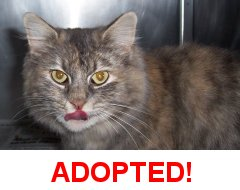

In [5]:
# Split the dataset
train_test_split = cats.train_test_split(test_size=0.2, seed=42)
test_val_split = train_test_split['test'].train_test_split(test_size=0.5, seed=42)
train_dataset = train_test_split['train']['image']
val_dataset = test_val_split['train']['image']
test_dataset = test_val_split['test']['image']

print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")
train_dataset[0]

# 3 Creating Data Loaders

### 3.1 Masks WRITING TODO

In [6]:
hole_size = 20

def create_masks(N, im_h, im_w):
    x = int((im_w - hole_size) / 2.0)
    y = int((im_h - hole_size) / 2.0)
    mask = torch.zeros((1, im_h, im_w))
    mask[0, y : y + hole_size, x : x + hole_size] = 1
    masks = mask.repeat_interleave(N, dim=0)
    # masks = torch.cat(masks, dim=0)
    return masks.unsqueeze(1)

### 3.2 Creating Cat Dataset Definition

The following class defines our Cat Dataset

In [7]:
class CatDataset(Dataset):
    def __init__(self, all_imgs, transforms=None) -> None:
        super().__init__()
        self.transforms = transforms
        self.all_imgs = all_imgs


    def __len__(self):
        return len(self.all_imgs)

    def __getitem__(self, index):
        image = self.all_imgs[index]


        transformed_img = self.transforms(image)

        # print(image.shape[0])
        if transformed_img.shape[0] == 1:
            transformed_img = transformed_img.repeat(3, 1, 1)

        # create deep copy of image for transformation
        ground_truth_image = deepcopy(transformed_img)

        # # change center depending on where to randomize
        mask = create_masks(1, 64, 64)[0]
        transformed_img = (1 - mask) * transformed_img
        # transformed_img[:, 10:20, 10:20] = torch.rand((3, 10, 10))
        #transformed_img[:, 96:160, 96:160] = torch.rand((3, 64, 64))

        return transformed_img, ground_truth_image

### 3.3 Transformations TO DO FIX WRITING

We experimented with several transformations, including different versions of crops and normalizations. The model performance was best when we simply converted pixel values into [0, 1] range and resized the entire image to 64x64 rather than taking a crop of the image.

In [8]:
transforms = v2.Compose([
    v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)]),
    v2.Resize(size=(64, 64))
])

transformed_train_dataset = CatDataset(train_dataset, transforms=transforms)
transformed_val_dataset = CatDataset(val_dataset, transforms=transforms)
transformed_test_dataset = CatDataset(test_dataset, transforms=transforms)

### 3.4 Explore Dataset

In [9]:
item0, item1, item2 = transformed_train_dataset[10], transformed_train_dataset[1], transformed_train_dataset[2]

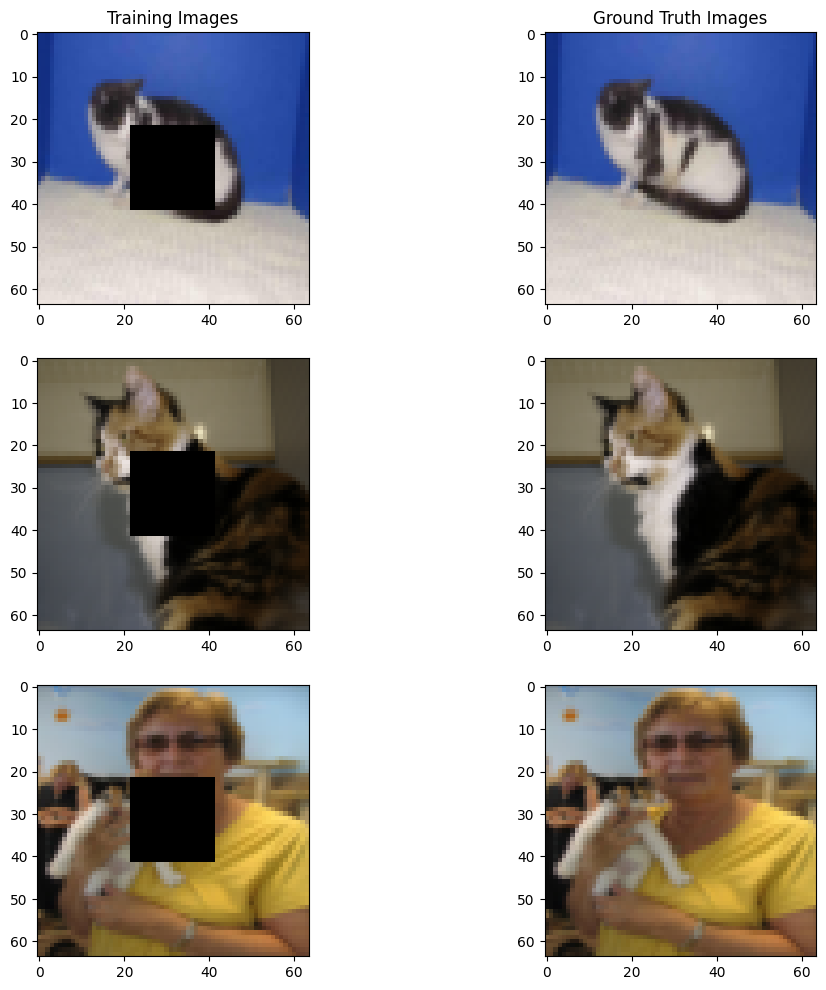

In [10]:
# train image
f, ax = plt.subplots(3, 2, figsize=(12, 12))
ax[0, 0].imshow(np.transpose(item0[0], (1, 2, 0)))
ax[0, 1].imshow(np.transpose(item0[1], (1, 2, 0)))
ax[1, 0].imshow(np.transpose(item1[0], (1, 2, 0)))
ax[1, 1].imshow(np.transpose(item1[1], (1, 2, 0)))
ax[2, 0].imshow(np.transpose(item2[0], (1, 2, 0)))
ax[2, 1].imshow(np.transpose(item2[1], (1, 2, 0)))

ax[0, 0].set_title("Training Images");
ax[0, 1].set_title("Ground Truth Images");


### 3.5 Setup Dataloader

In [11]:
train_dataset, val_dataset, test_dataset = transformed_train_dataset, transformed_val_dataset, transformed_test_dataset

In [12]:
BATCH_SIZE = 8
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)

# 4 GAN Model

GANS TO DO

### 4.1 Generator

In [13]:
class Generator(nn.Module):

    def __init__(self, im_channels):
        super().__init__()

        # Encoder
        self.conv1 = nn.Conv2d(im_channels + 1, 64, 5, stride=1, padding=2)

        self.conv2 = nn.Conv2d(64, 128, 3, stride=2, padding=1)

        self.conv3 = nn.Conv2d(128, 256, 3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(256, 256, 3, stride=1, padding=1)

        # Dilation
        self.conv5 = nn.Conv2d(256, 256, 3, stride=1, padding=1, dilation=2)
        self.conv6 = nn.Conv2d(256, 256, 3, stride=1, padding=1, dilation=4)

        self.conv7 = nn.Conv2d(256, 256, 3, stride=1, padding=1)

        # Decoder
        self.deconv8 = nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1)
        self.conv9 = nn.Conv2d(128, 128, 3, stride=1, padding=1)

        self.deconv10 = nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1)
        self.deconv11 = nn.ConvTranspose2d(64, 64, 4, stride=2, padding=1)
        self.conv11 = nn.Conv2d(64, 64, 3, stride=1, padding=1)
        self.conv12 = nn.Conv2d(64, 3, 3, stride=1, padding=1)

        self.bn1 = nn.BatchNorm2d(64)
        self.bn2 = nn.BatchNorm2d(128)
        self.bn3 = nn.BatchNorm2d(256)
        self.bn4 = nn.BatchNorm2d(256)
        self.bn5 = nn.BatchNorm2d(256)
        self.bn6 = nn.BatchNorm2d(256)
        self.bn7 = nn.BatchNorm2d(256)
        self.bn8 = nn.BatchNorm2d(128)
        self.bn9 = nn.BatchNorm2d(128)
        self.bn10 = nn.BatchNorm2d(64)
        self.bn11 = nn.BatchNorm2d(64)

        self.relu = torch.nn.ReLU()
        self.sig = nn.Sigmoid()

    def forward(self, x):
         # encode
        x1 = self.bn1(self.relu(self.conv1(x)))
        x2 = self.bn2(self.relu(self.conv2(x1)))
        # print("After deconv2:", x2.shape)
        x3 = self.bn3(self.relu(self.conv3(x2)))
        # print("After deconv3:", x3.shape)
        x4 = self.bn4(self.relu(self.conv4(x3)))
        # print("After deconv4:", x4.shape)
        x5 = self.bn5(self.relu(self.conv5(x4)))
        # print("After deconv5:", x5.shape)
        x6 = self.bn6(self.relu(self.conv6(x5)))
        # print("After deconv6:", x6.shape)
        x7 = self.bn7(self.relu(self.conv7(x6)))

        # print("After deconv7:", x7.shape)
        x8 = self.bn8(self.relu(self.deconv8(x7)))
        # print("After deconv8:", x8.shape)
        x9 = self.bn9(self.relu(self.conv9(x8)))
        x10 = self.bn10(self.relu(self.deconv10(x9)))
        x11 = self.bn10(self.relu(self.deconv11(x10)))
        # print("After deconv10:", x11.shape)
        x12 = self.bn11(self.relu(self.conv11(x11)))

        output = self.sig(self.conv12(x11))
        return output


### 4.2 Discriminator

In [14]:
class Discriminator(nn.Module):
    """
        This is the discriminator class. The discriminator takes in an image and its job is to classify whether the image is generated(fake)
        or real (non-generated).

        The architecture of the network is the same as a simple CNN classifier
        with the following architecture:
            1) 4x64x64   -> 64x32x32
            2) 64x32x32  -> 128x16x16
            3) 128x16X16 -> 256x8x8
            4) 256x8x8   -> 512x4x4
            5) 512x4x4   -> 512x1x1
            6) 512 -> 512
            7) 512 -> 512
            8) 512 -> 256
            9) 256 -> 10
            10) 10 -> 1
    """
    def __init__(self):
        super().__init__() # wtf does this do
        # conv layers
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1)

        # batch norm layers
        self.bn1 = nn.BatchNorm2d(64)
        self.bn2 = nn.BatchNorm2d(128)
        self.bn3 = nn.BatchNorm2d(256)
        self.bn4 = nn.BatchNorm2d(512)

        # linear layers
        self.fc1 = nn.Linear(512, 512)
        self.fc2 = nn.Linear(512, 512)
        self.fc3 = nn.Linear(512, 256)
        self.fc4 = nn.Linear(256, 10)
        self.fc5 = nn.Linear(10, 1)

        # non-learnable layers
        self.relu = nn.ReLU()
        self.down_sample = nn.AvgPool2d(2)
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1)) # self.max_pool = nn.MaxPool2d(4)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # conv layers
        x = self.down_sample(self.conv1(x))
        x = self.relu(x)
        x = self.bn1(x)

        x = self.down_sample(self.conv2(x))
        x = self.relu(x)
        x = self.bn2(x)

        x = self.down_sample(self.conv3(x))
        x = self.relu(x)
        x = self.bn3(x)

        x = self.down_sample(self.conv4(x))
        x = self.relu(x)
        x = self.bn4(x)

        x = self.global_pool(x)
        x = x.view(x.size(0), -1) # x = x.view(x.size(0), x.size(1))
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        x = self.relu(x)
        x = self.fc4(x)
        x = self.relu(x)
        x = self.fc5(x)
        x = self.sigmoid(x)

        # print("After x:", x.shape)
        return x

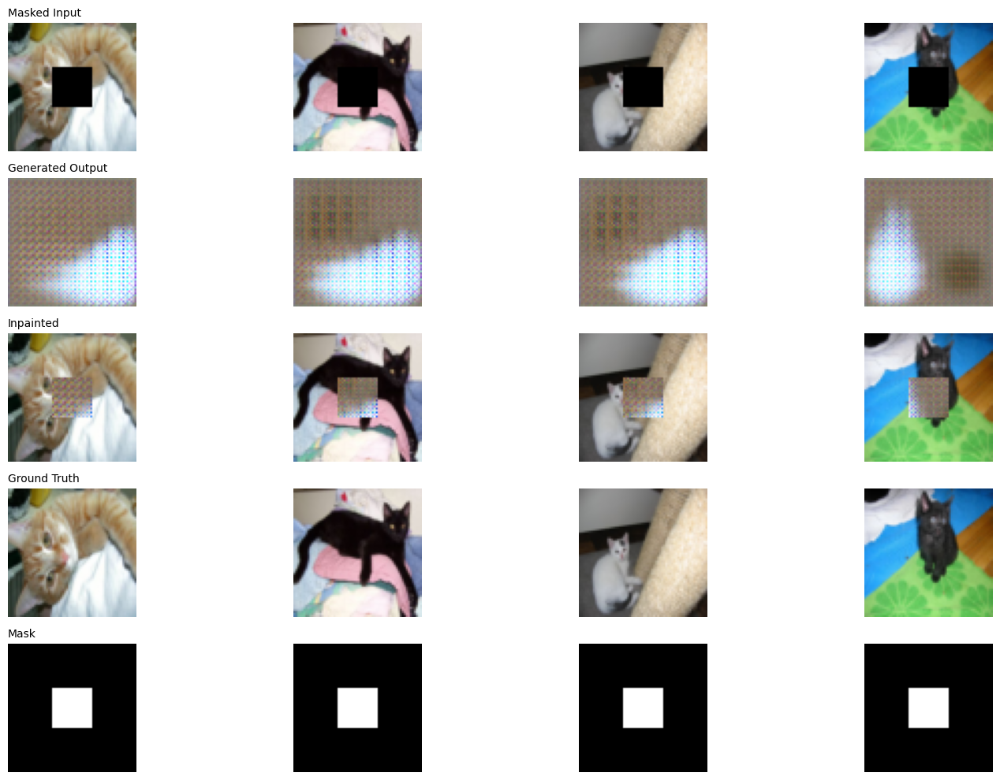

Epoch [1/15], Step [1000/1174], Discriminator Loss: 1.3838, Generator Loss: 0.8108


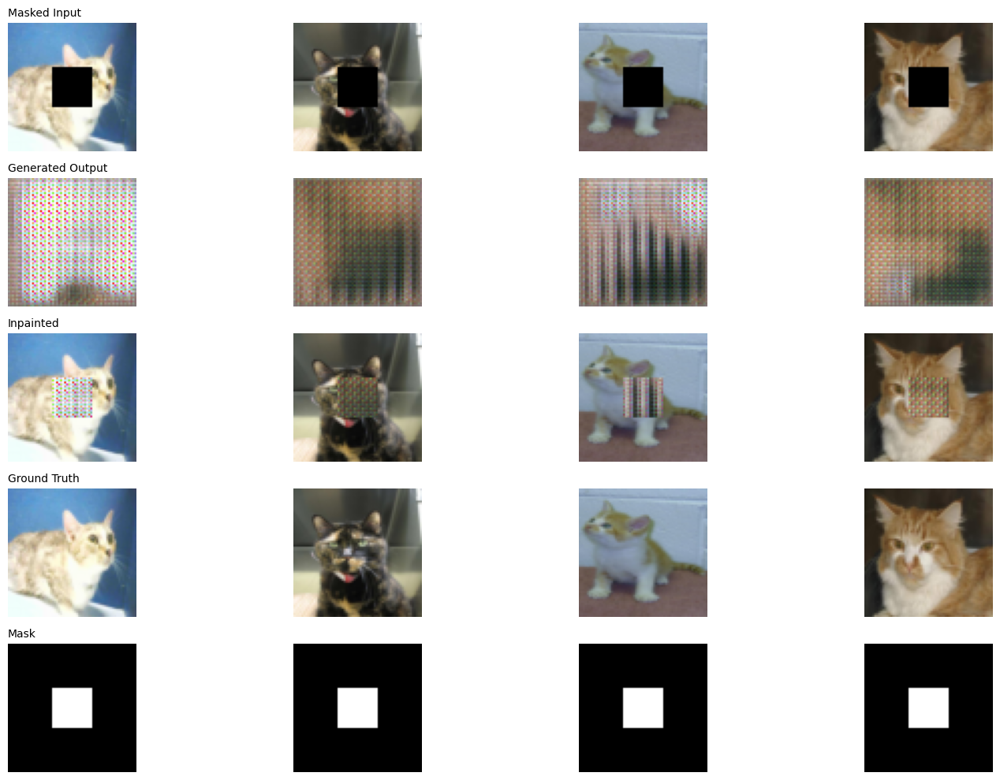

Epoch [2/15], Step [1000/1174], Discriminator Loss: 1.1739, Generator Loss: 0.9645


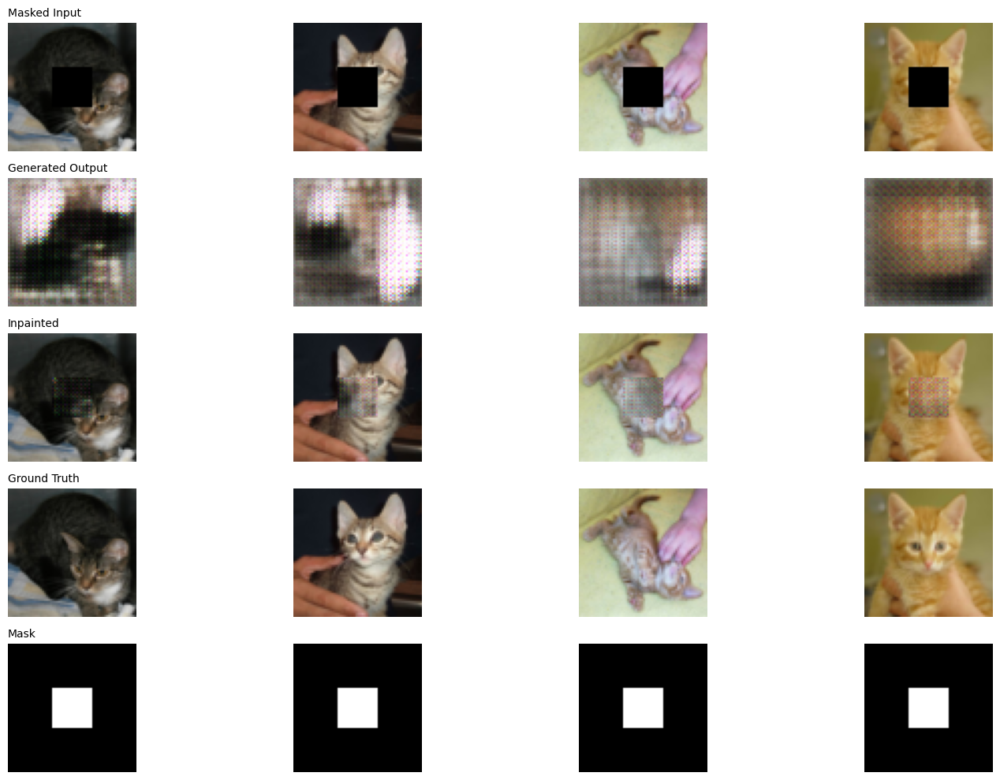

Epoch [3/15], Step [1000/1174], Discriminator Loss: 1.1909, Generator Loss: 0.9002


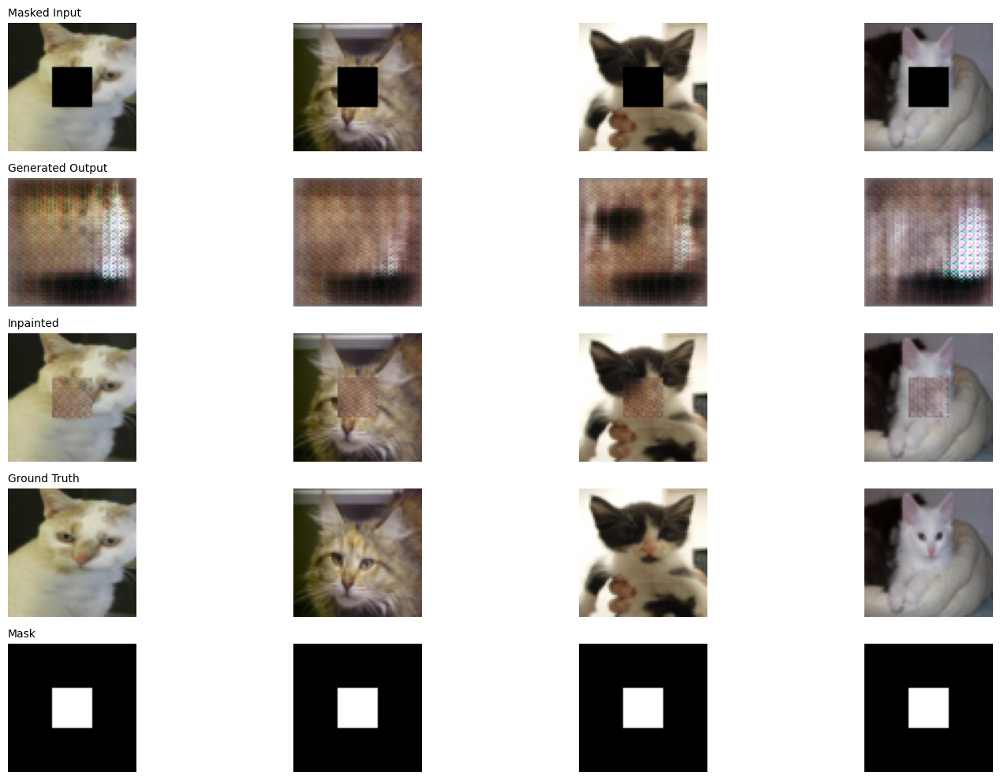

Epoch [4/15], Step [1000/1174], Discriminator Loss: 1.3857, Generator Loss: 0.5405


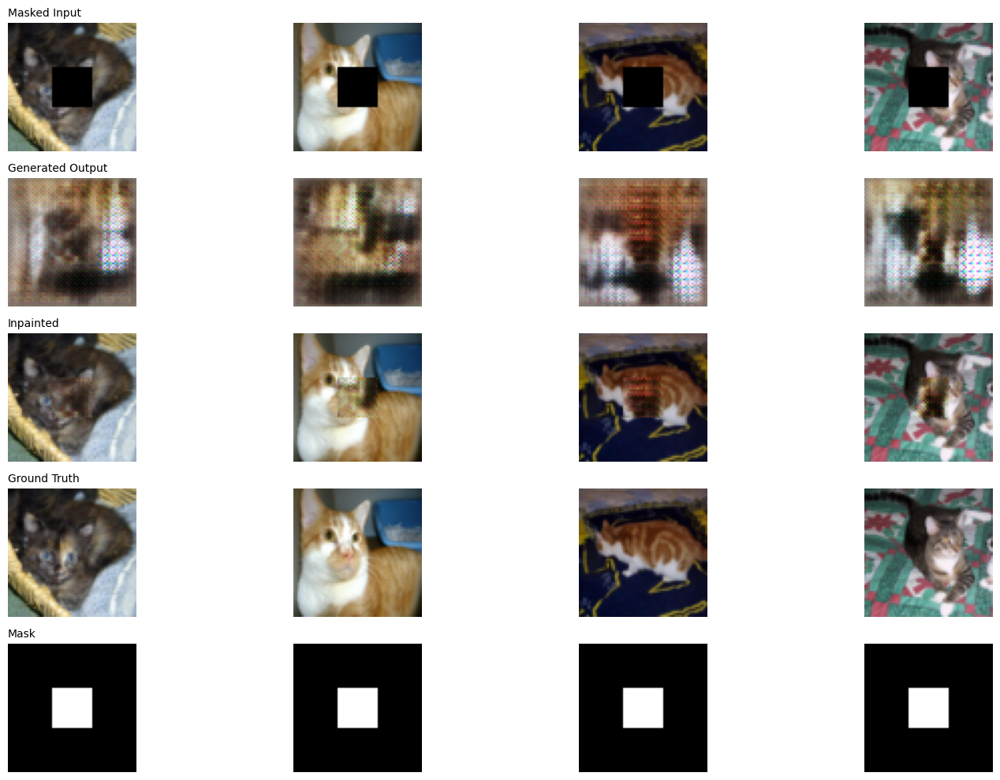

Epoch [5/15], Step [1000/1174], Discriminator Loss: 0.9411, Generator Loss: 1.2577


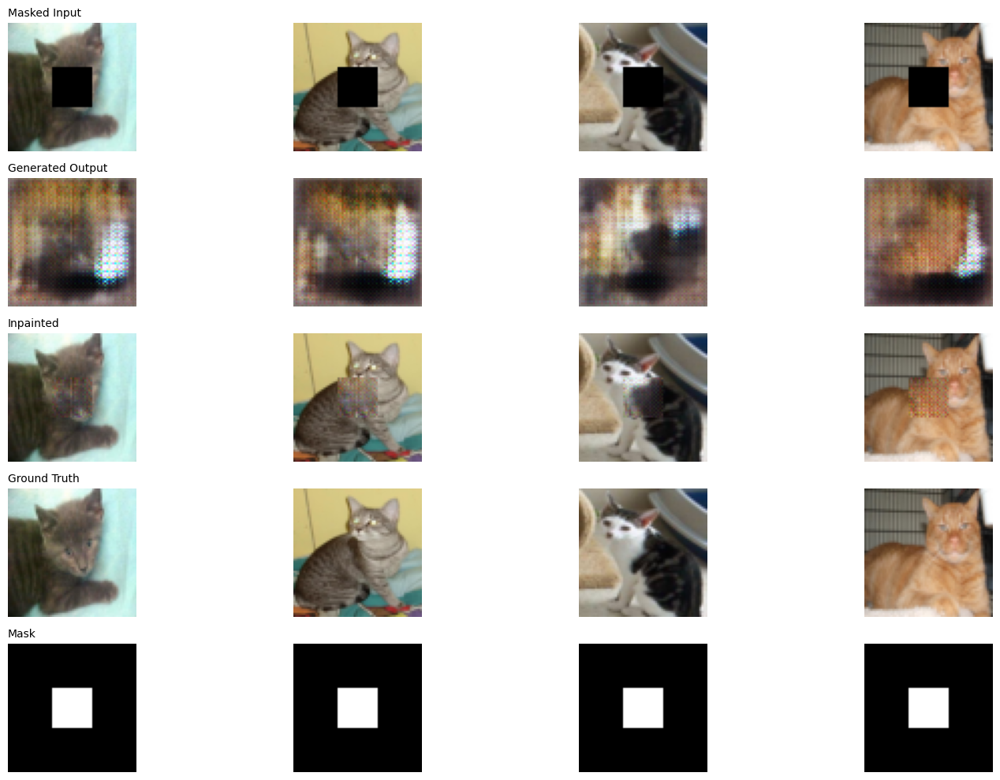

Epoch [6/15], Step [1000/1174], Discriminator Loss: 1.0423, Generator Loss: 1.1808


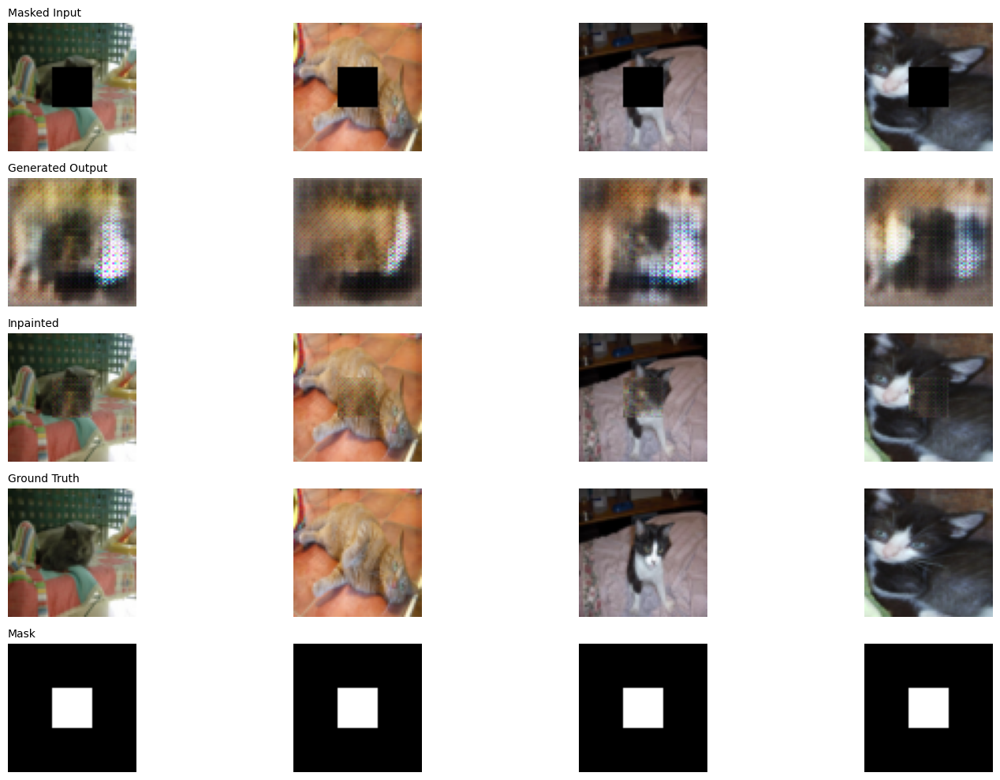

Epoch [7/15], Step [1000/1174], Discriminator Loss: 0.8058, Generator Loss: 2.9503


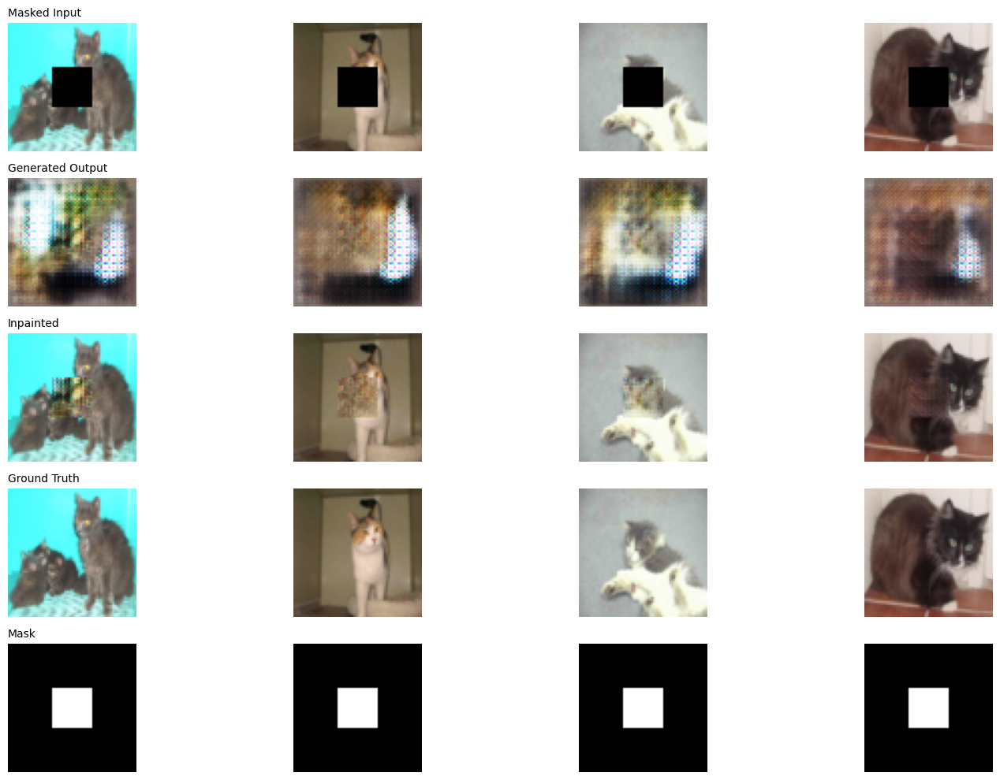

Epoch [8/15], Step [1000/1174], Discriminator Loss: 0.7359, Generator Loss: 1.4827


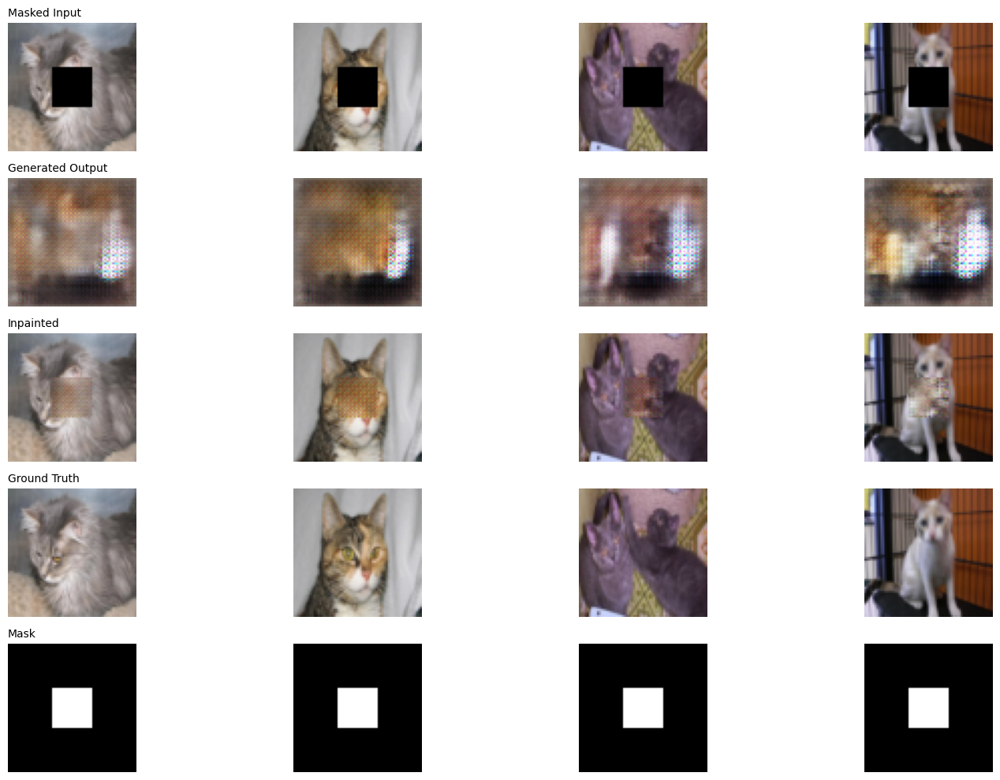

Epoch [9/15], Step [1000/1174], Discriminator Loss: 0.4298, Generator Loss: 3.8674


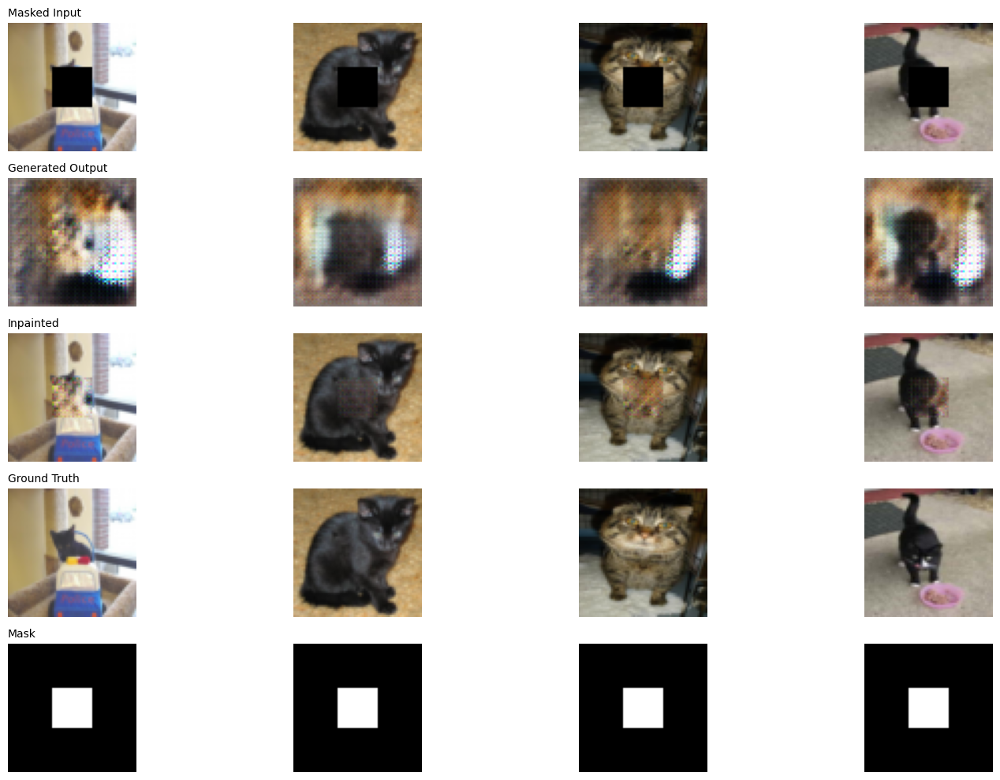

Epoch [10/15], Step [1000/1174], Discriminator Loss: 1.0559, Generator Loss: 1.1209


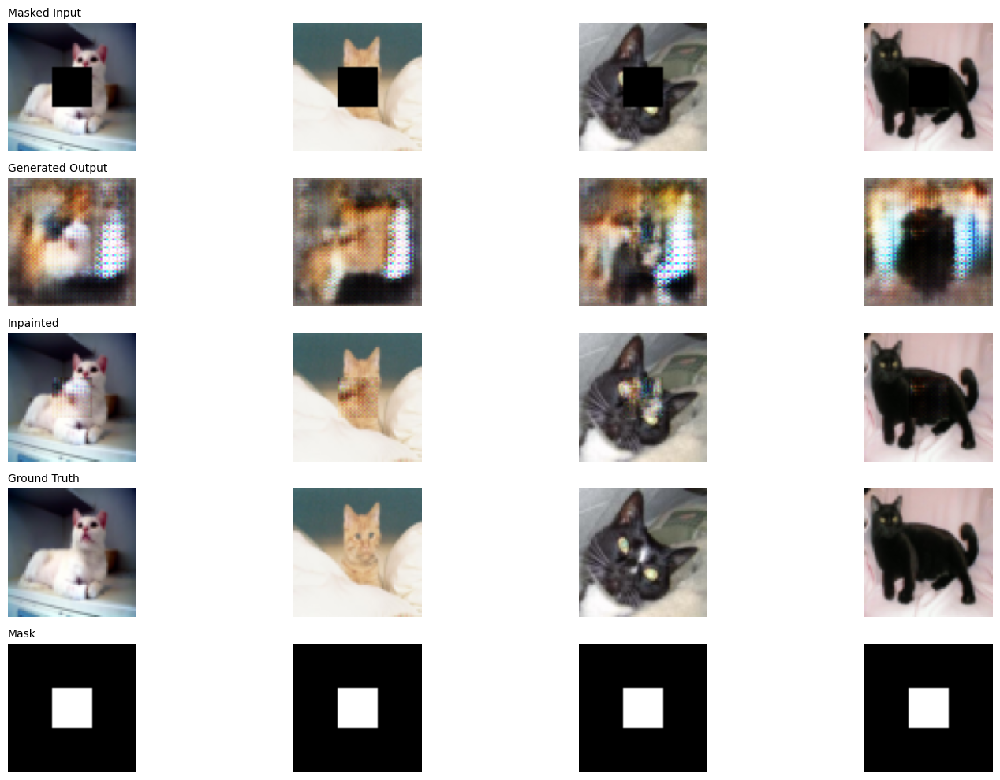

Epoch [11/15], Step [1000/1174], Discriminator Loss: 1.2170, Generator Loss: 1.8694


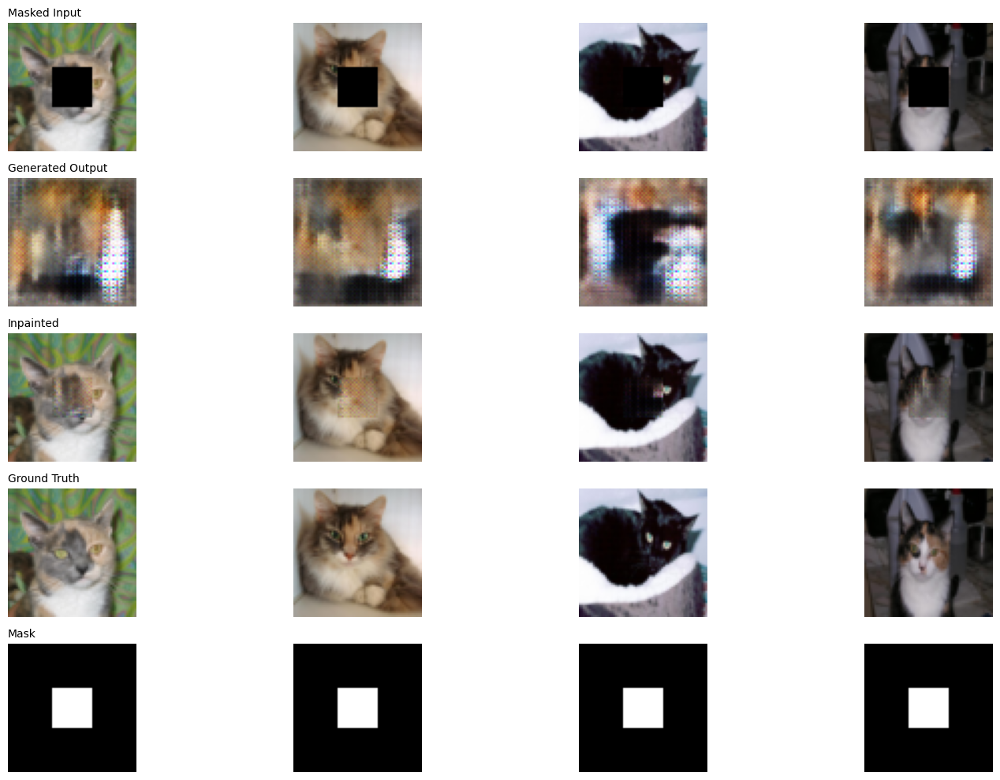

Epoch [12/15], Step [1000/1174], Discriminator Loss: 1.5336, Generator Loss: 3.4300


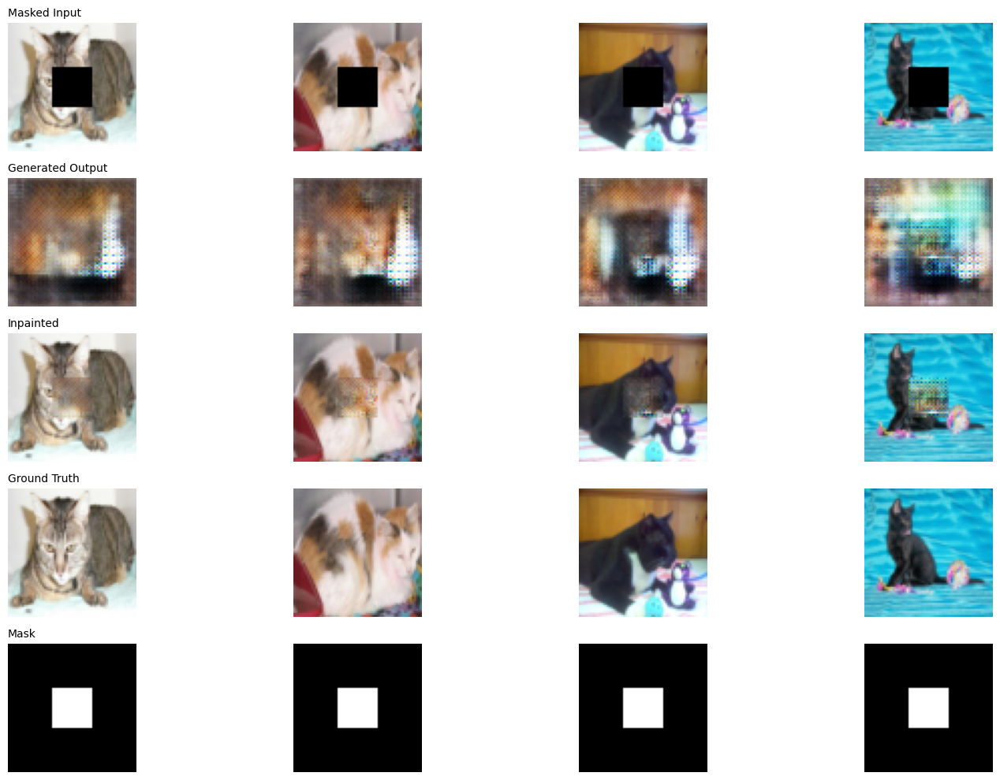

Epoch [13/15], Step [1000/1174], Discriminator Loss: 0.6191, Generator Loss: 3.0675


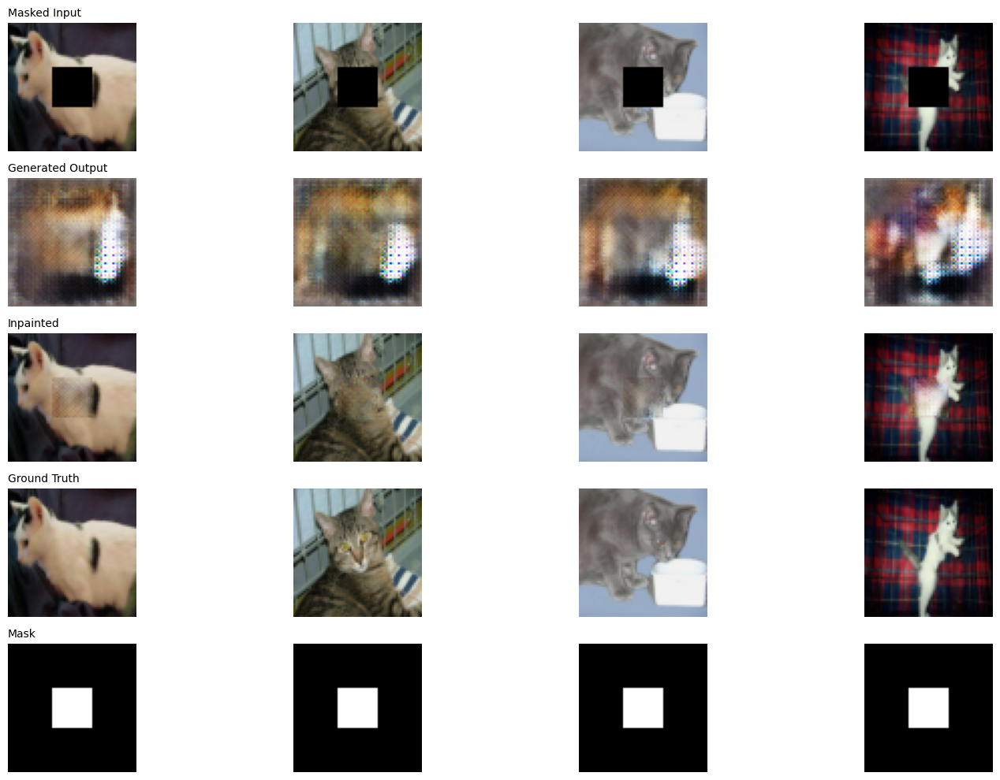

Epoch [14/15], Step [1000/1174], Discriminator Loss: 0.5400, Generator Loss: 2.4221


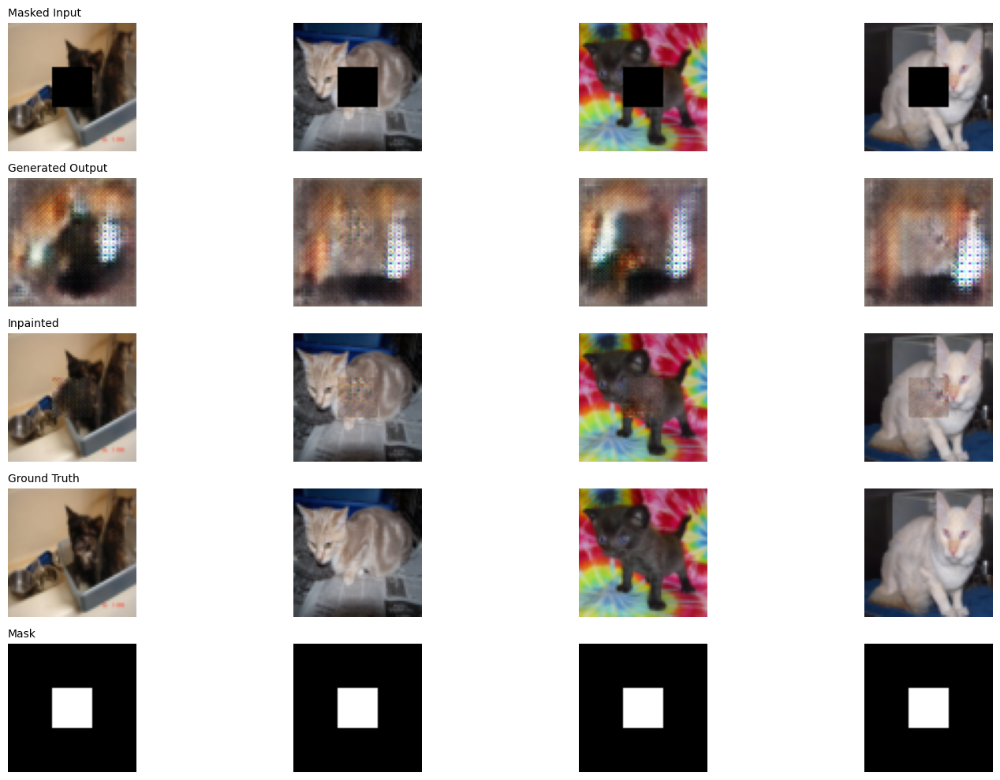

Epoch [15/15], Step [1000/1174], Discriminator Loss: 0.9072, Generator Loss: 1.3671


In [15]:
import time
import torchvision.utils as vutils
import matplotlib.pyplot as plt



# train_loader = data.DataLoader(train, batch_size=params['batch_size'], num_workers=0, pin_memory=True)
# val_loader = data.DataLoader(val, params['val_batch_size'], shuffle=True, pin_memory=True)
# val_loader = iter(cycle(val_loader))

d = Discriminator().to(device)
g = Generator(im_channels=3).to(device)

optimizer_g = optim.Adam(g.parameters(), lr=0.0001)
optimizer_d = optim.Adam(d.parameters(), lr=0.0001)
criterion = nn.BCELoss()



# w = params['w']
num_epochs = 15

total_step = len(train_loader)
val_iter = iter(val_loader)
for epoch in range(num_epochs):
  g.train()
  d.train()
  for i, batch in enumerate(train_loader):
    im_masked, im_truth = batch

    # Move data to GPU
    im_masked = im_masked.to(device)
    im_truth = im_truth.to(device)

    N = batch[0].shape[0]

    masks = create_masks(N, 64, 64).to(device)


    # im_truth = torch.cat((im_truth, masks), dim=1)
    im_masked = torch.cat((im_masked, masks), dim=1)


    # Train Discriminator

    d.zero_grad()

    true_labels = torch.ones(N).to(device)
    fake_labels = torch.zeros(N).to(device)

    outputs = d(im_truth).view(-1)

    d_err = criterion(outputs, true_labels)


    fake_im = g(im_masked)
    inpainted = fake_im * masks[0] + im_masked[:, :3, :, :]
    output = d(inpainted.detach()).view(-1)
    d_err += criterion(output, fake_labels)

    d_err.backward()

    optimizer_d.step()
    # ------------------------------------------------------------


    g.zero_grad()

    fake_im = g(im_masked)
    inpainted = fake_im * masks[0] + im_masked[:, :3, :, :]
    outputs = d(inpainted).view(-1) # pass in fake image + real image

    # f, ax = plt.subplots(3, 2, figsize=(12, 12))

    # # Select the first image from the batch and move it to CPU
    # img = inpainted[0].detach().cpu()  # Shape: [3, H, W]

    # # Convert to HWC for matplotlib
    # img = img.permute(1, 2, 0).numpy()  # Shape: [H, W, 3]

    # # Plot it
    # ax[0, 0].imshow(img)
    # ax[0, 0].axis("off")
    # ax[0, 0].set_title("Inpainted Image")

    # plt.tight_layout()
    # plt.show()

    # break


    g_err = criterion(outputs, true_labels)
    g_err.backward()
    optimizer_g.step()

    if (i+1) % 1000 == 0:
      g.eval()
      with torch.no_grad():
          val_batch = next(val_iter)
          val_masked, val_truth = val_batch

          # Move validation data to GPU
          val_masked = val_masked.to(device)
          val_truth = val_truth.to(device)

          N = val_masked.shape[0]

          val_masks = create_masks(N, 64, 64).to(device)
          val_input = torch.cat((val_masked, val_masks), dim=1)

          fake_val = g(val_input)

          # Inpainting (fill in only masked region)
          inpainted = val_masked * (1 - val_masks) + fake_val * val_masks

          # Unpainted: original image with blacked out masked areas
          unpainted = val_truth * (1 - val_masks)

          # Get first 4 samples
          idx = slice(0, 4)
          sample_masked     = val_masked[idx]
          sample_fake       = fake_val[idx]
          sample_inpainted  = inpainted[idx]
          sample_truth      = val_truth[idx]
          sample_mask       = val_masks[idx].repeat(1, 3, 1, 1)  # grayscale → RGB


          images = [
              sample_masked,
              sample_fake,
              sample_inpainted,
              sample_truth,
              sample_mask,
          ]
          labels = [
              "Masked Input",
              "Generated Output",
              "Inpainted",
              "Ground Truth",
              "Mask",
          ]

          # Plot
          fig, axs = plt.subplots(len(images), 4, figsize=(16, 10))
          for row in range(len(images)):
              for col in range(4):
                  img = images[row][col].cpu()
                  img = img.permute(1, 2, 0)  # CxHxW → HxWxC
                  axs[row, col].imshow(img.numpy(), cmap='gray' if img.shape[2] == 1 else None)
                  axs[row, col].axis('off')
                  if col == 0:
                      axs[row, col].set_title(labels[row], fontsize=10, loc='left')
          plt.tight_layout()
          plt.show()

      g.train()
      print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{total_step}], '
            f'Discriminator Loss: {d_err.item():.4f}, '
            f'Generator Loss: {g_err.item():.4f}')

